In [1]:
import pandas as pd
import numpy as np
from q2_extractor import Extractor
from qiime2 import Artifact
import skbio
import ete3

## Input Data
Change the `alpha_depth` parameter and re-run the code to get the results for a different read depth.

Higher read depth excludes more samples.

Default for GitHub push is set to 1000.

In [2]:
metadata = pd.read_csv("data/METADATA.txt", sep="\t", index_col=0)
tax = Artifact.load("artifacts/taxonomy.qza")
asv_table = Artifact.load("artifacts/unfiltered_table.qza")
md = metadata

In [3]:
tree = Extractor.q2Extractor("artifacts/rooted_tree.qza")
tree = tree.extract_data()
ptax = tax.view(pd.DataFrame)

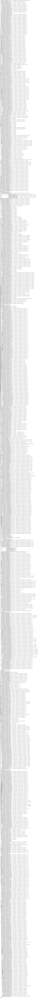

In [4]:
def layout_mapper(node):
    if node.is_leaf():
        ete3.faces.add_face_to_node(ete3.faces.TextFace(ptax.loc[node.name, "Taxon"]), node, 0)
ts = ete3.TreeStyle()
ts.layout_fn = layout_mapper
subtree = tree.get_common_ancestor(ptax[ptax["Taxon"].str.contains("g__Lactobacillus")].index.tolist())
subtree.render(file_name="%%inline", tree_style=ts)